In [4]:
import numpy as np
import pandas as pd 
import seaborn as sns 
import csv
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import StandardScaler
from scipy import stats
from scipy.stats import norm

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [5]:
#df_train contains data as is
df_train = pd.read_csv('train.csv')

In [6]:
df_train.shape

(1460, 81)

In [350]:
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

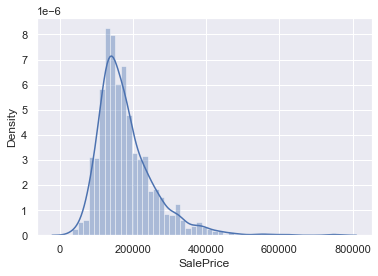

In [249]:
#строим гистограмму для визуального оценивания распределения цены
sns.distplot(df_train['SalePrice'])
#распределение не нормальное, унимодальное, выражен скос вправо

In [251]:
#оценивание моментов второго порядка
#асимметрия (мера скошенности)
print(f"Skewness: {df_train['SalePrice'].skew():.3f}")
#эксцесс (мера остроты пика)
print(f"Kurtosis: {df_train['SalePrice'].kurt():.3f}")

#наблюдается скос вправо и сильный пик

Skewness: 1.883
Kurtosis: 6.536


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='GrLivArea', ylabel='SalePrice'>

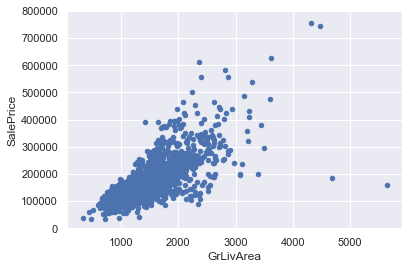

In [253]:
#we have to explore dependence between 'GrLivArea' and 'SalePrice'
#GrLivArea: Above grade (ground) living area square feet
#Жилая площадь выше уровня земли

df_train.plot.scatter(x='GrLivArea', y='SalePrice', ylim=(0,800000))

#между величинами наблюдается устойчивая положительная связь:
#чем больше площадь, тем дороже дом
#но есть и выбросы - недорогие дома большой площади 
#выбросы, возможно, нужно будет удалить, поскольку они могут привести к переобучению

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


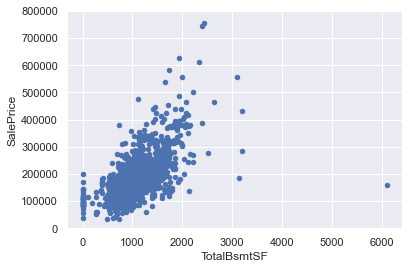

In [255]:
#we have to explore dependence between 'TotalBsmtSF' and 'SalePrice'
#TotalBsmtSF: Total square feet of basement area
#Общая площадь помещений цокольного этажа

df_train.plot.scatter(x='TotalBsmtSF', y='SalePrice', ylim=(0,800000));

#между величинами наблюдается положительная связь, однако она не является линейной

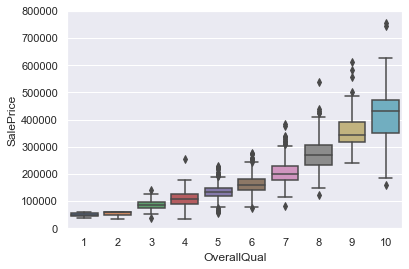

In [257]:
#зависимость цены от общего состояния объекта недвижимости
fig = sns.boxplot(x='OverallQual', y='SalePrice', data=df_train)
fig.axis(ymin=0, ymax=800000);
#наблюдается положительная корреляция

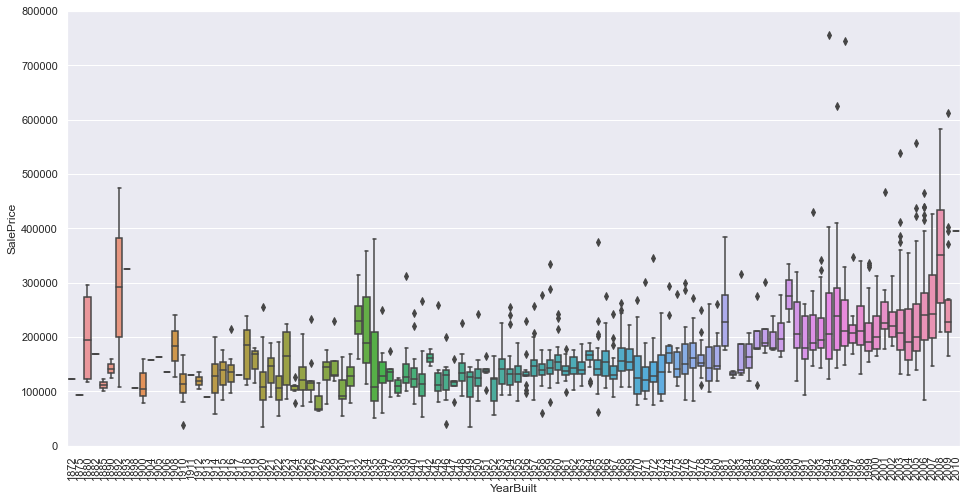

In [259]:
#зависимость цены от года постройки
plt.subplots(figsize=(16,8))
fig = sns.boxplot(x='YearBuilt', y='SalePrice', data=df_train)
fig.axis(ymin=0, ymax=800000)
plt.xticks(rotation=90);

In [261]:
#df_test contains data as is
df_test = pd.read_csv('test.csv')

## feature selection

* correlation matrix
* 'SalePrice' correlation matrix
* scatter plots between the most correlated variables

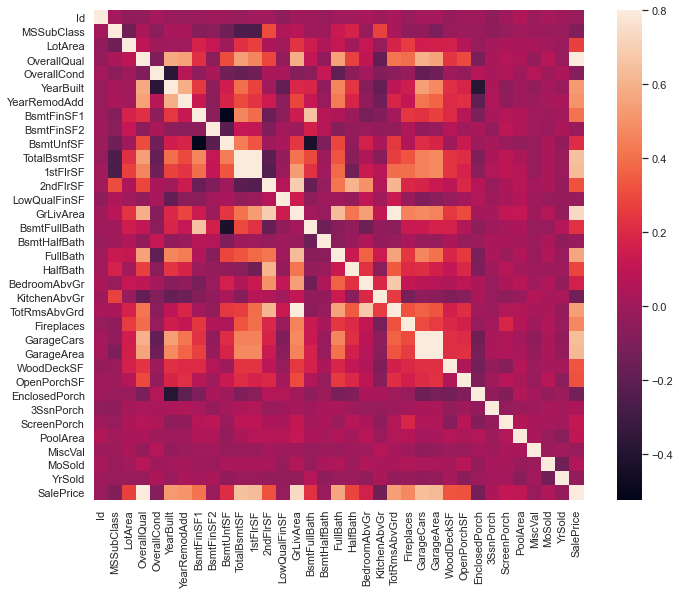

In [263]:
#correlation matrix

#тепловая карта. позволяет быстро оценить зависимость между переменными
#и выявить мультиколлинеарность (это плохо, модель не построить)

corrmat = df_train.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

#видны белые квадраты, которые указвывают на зависимость между:
# 'TotalBsmtSF' и '1stFlrSF'
# 'GarageCars' и 'GarageArea'

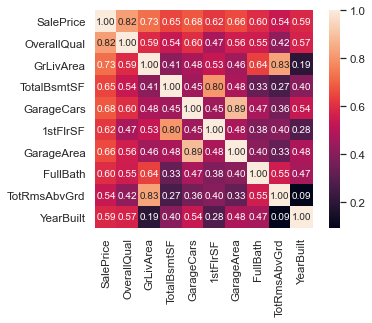

In [265]:
# 'SalePrice' correlation matrix
k = 10
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(df_train[cols].values.T)
sns.set(font_scale=1.05)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()
#most correlated features:
# 'TotalBsmtSF' и '1stFlrSF' ('1stFlrSF' have to be deleted from dataset)
# 'GarageCars' и 'GarageArea' ('GarageArea' have to be deleted from dataset)
# 'GrLivArea' and 'TotRmsAbvGrd' (one of them have to be deleted)

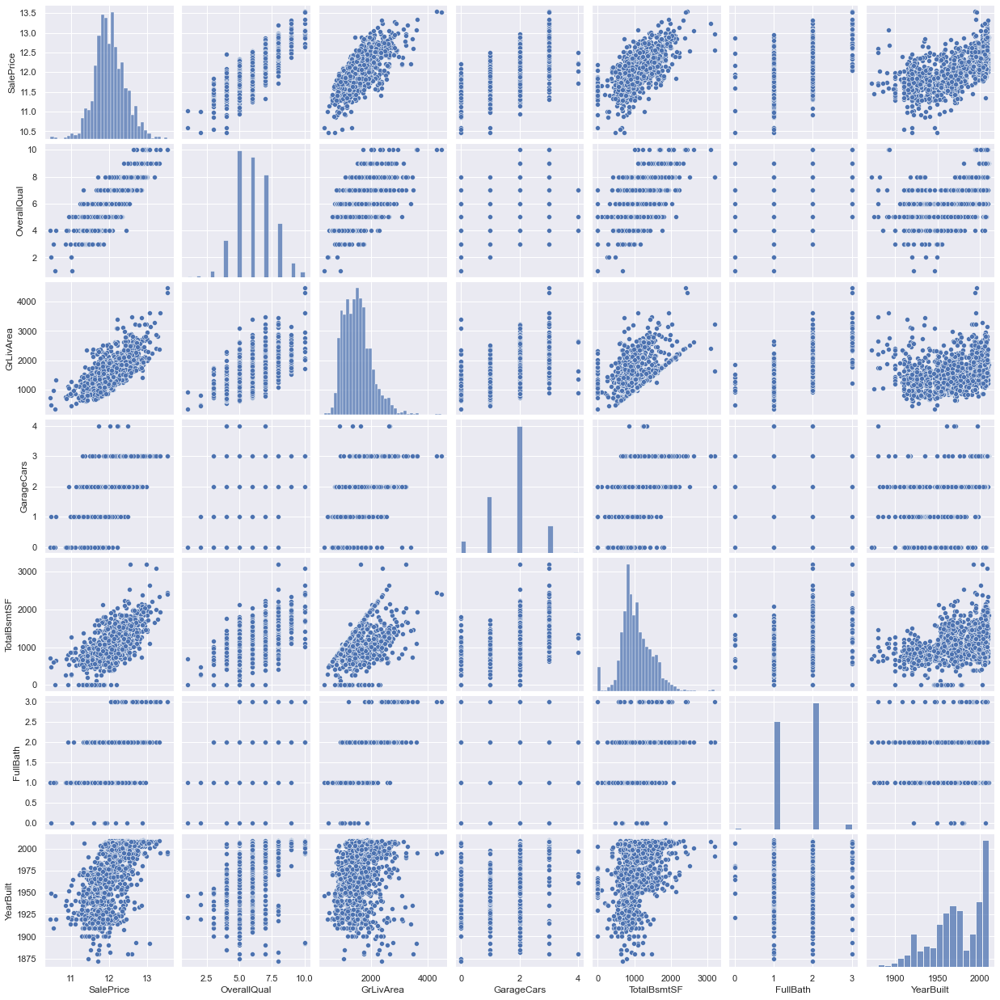

In [267]:
# scatter plots between the most correlated variables
sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']
sns.pairplot(df_train[cols])
plt.show();

## work with missing data
* work with missing data: delete feature, drop points, fillna and so on
* work with outliars

In [269]:
#missing data
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
SalePrice,0,0.0
OverallQual,0,0.0
BsmtUnfSF,0,0.0
BsmtFinSF2,0,0.0
BsmtFinSF1,0,0.0
Foundation,0,0.0
ExterCond,0,0.0
ExterQual,0,0.0
Exterior2nd,0,0.0
Exterior1st,0,0.0


In [271]:
#dealing with missing data
#что и почему мы удаляем

#удаляем все колонки, в которых более 15% пустых значений - PoolQC, MiscFeatures, Alley, Fence, FirePlaceQu, LotFrontage

#в колонках GarageX одинаковое количество пропущенных значений
#при этом наиболее важная информация по гаражам содержится в колонке GarageCars
#следовательно, остальные колонки GarageX можно удалить

df_train = df_train.drop((missing_data[missing_data['Total'] > 1]).index, 1)

#Electrical имеет всего один пропуск, поэтому удаляем строку, а не колонку

df_train = df_train.drop(df_train.loc[df_train['Electrical'].isnull()].index)
df_train.isnull().sum().max() #just checking that there's no missing data missing...

0

In [273]:
#outliers

#standartizing SalePrice
#data standardization means converting data values to have mean of 0 and a standard deviation of 1.

saleprice_scaled = StandardScaler().fit_transform(df_train['SalePrice'][:,np.newaxis]);
low_range = saleprice_scaled[saleprice_scaled[:,0].argsort()][:10]
high_range= saleprice_scaled[saleprice_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

#Low range values are similar and not too far from 0.
#High range values are far from 0 and the 7.something values are really out of range.

#пока ничего не удаляем

outer range (low) of the distribution:
[[-3.91219174]
 [-3.88290165]
 [-3.70588425]
 [-3.61513617]
 [-3.5709674 ]
 [-2.91458974]
 [-2.89064908]
 [-2.77426623]
 [-2.77426623]
 [-2.72950064]]

outer range (high) of the distribution:
[[2.67164773]
 [2.75702466]
 [2.93110651]
 [3.00893577]
 [3.01605233]
 [3.13178353]
 [3.25211767]
 [3.30610604]
 [3.74550008]
 [3.77885764]]


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


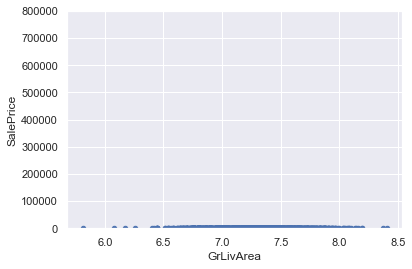

In [275]:
df_train.plot.scatter(x='GrLivArea', y='SalePrice', ylim=(0,800000));

In [277]:
#удаляем выбросы в цене
df_train.sort_values(by = 'GrLivArea', ascending = False)[:2]
df_train = df_train.drop(df_train[(df_train.SalePrice < 200000) & (df_train.GrLivArea > 4000)].index)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='GrLivArea', ylabel='SalePrice'>

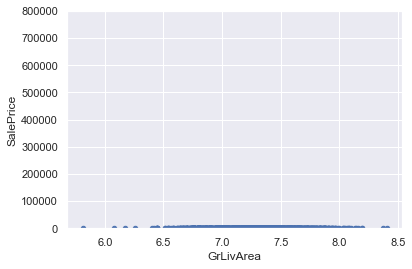

In [279]:
df_train.plot.scatter(x='GrLivArea', y='SalePrice', ylim=(0,800000))

## take a look on 'SalePrice'

According to Hair et al. (2013), four assumptions should be tested:

Normality 

Homoscedasticity - Гомоскедастичность — свойство, означающее постоянство условной дисперсии вектора или последовательности случайных величин. Однородная вариативность значений наблюдений, выражающаяся в стабильности, однородности дисперсии случайной ошибки регрессионной модели — дисперсии одинаковы во все моменты измерения. Противоположное явление носит название гетероскедастичности.

Linearity- The most common way to assess linearity is to examine scatter plots and search for linear patterns. If patterns are not linear, it would be worthwhile to explore data transformations. However, we'll not get into this because most of the scatter plots we've seen appear to have linear relationships.

Absence of correlated errors - Correlated errors, like the definition suggests, happen when one error is correlated to another. For instance, if one positive error makes a negative error systematically, it means that there's a relationship between these variables. This occurs often in time series, where some patterns are time related. We'll also not get into this. However, if you detect something, try to add a variable that can explain the effect you're getting. That's the most common solution for correlated errors.

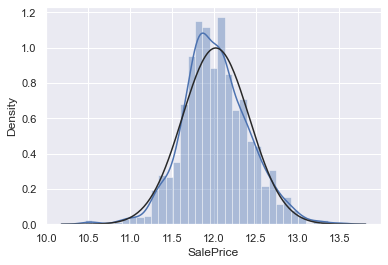

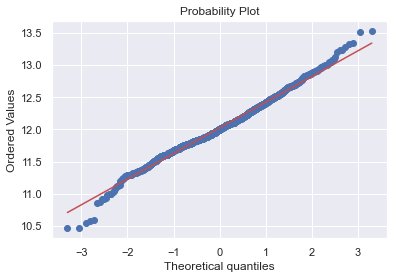

In [281]:
# normality

sns.distplot(df_train['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['SalePrice'], plot=plt)

# распределение цены не нормальное, имеет пик, скошено вправо
# на нижнем графике видно отличие теоретического распределения и эмпирического

In [283]:
# применим трюк, который работает в случае скоса распределения вправо:
# лог-трансформация. то есть возьмем 10чный логарифм от цены

df_train['SalePrice'] = np.log(df_train['SalePrice'])

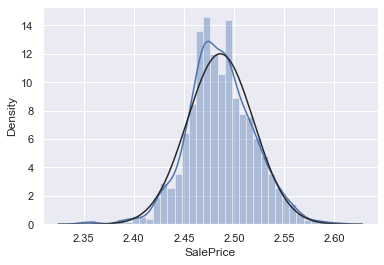

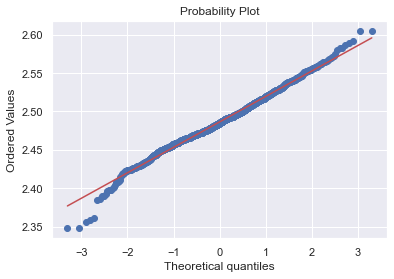

In [285]:
# строим  такой же график
#transformed histogram and normal probability plot
sns.distplot(df_train['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['SalePrice'], plot=plt)

# !!!! сработалоо - распределение логарифма цены - нормальное

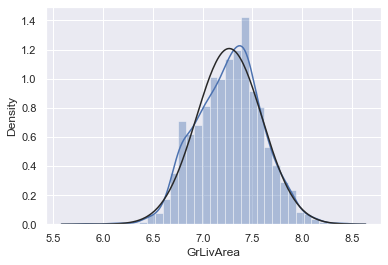

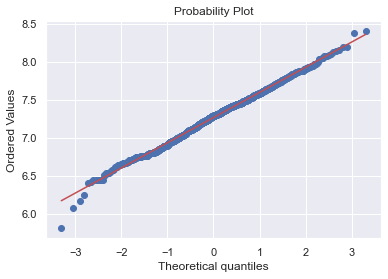

In [287]:
# то же и для GrLivArea

#histogram and normal probability plot
sns.distplot(df_train['GrLivArea'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['GrLivArea'], plot=plt)

In [289]:
# right skew, then apply log-transformation

#data transformation
df_train['GrLivArea'] = np.log(df_train['GrLivArea'])

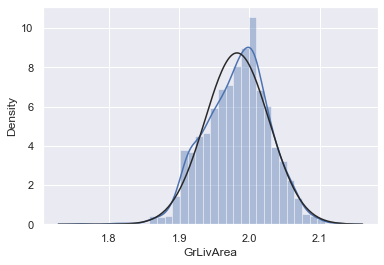

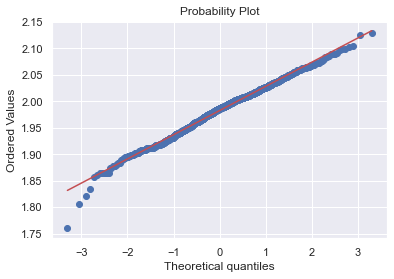

In [291]:
#transformed histogram and normal probability plot
sns.distplot(df_train['GrLivArea'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['GrLivArea'], plot=plt)

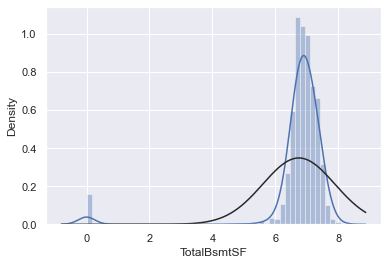

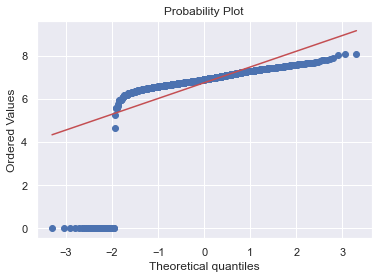

In [293]:
# let try to normalize TotalBsmtSF

sns.distplot(df_train['TotalBsmtSF'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['TotalBsmtSF'], plot=plt)

# анализ графтка показывает, что:
# - имеется скос вправо
# - значительное число нулевых значений, для которых неприменима лог-трансформация


In [295]:
# для преодоления этого противоречия необходимо ввести новое свойство "есть цокольный этаж" \ "нет цокольного этажа"
#create column for new variable (one is enough because it's a binary categorical feature)
#if area>0 it gets 1, for area==0 it gets 0
df_train['HasBsmt'] = pd.Series(len(df_train['TotalBsmtSF']), index=df_train.index)
df_train['HasBsmt'] = 0 
df_train.loc[df_train['TotalBsmtSF']>0,'HasBsmt'] = 1

In [297]:
#transform data
df_train.loc[df_train['HasBsmt']==1,'TotalBsmtSF'] = np.log(df_train['TotalBsmtSF'])

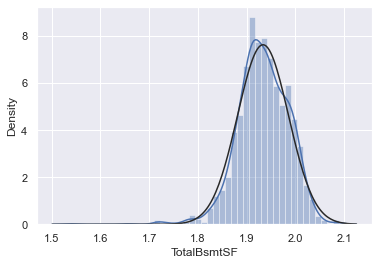

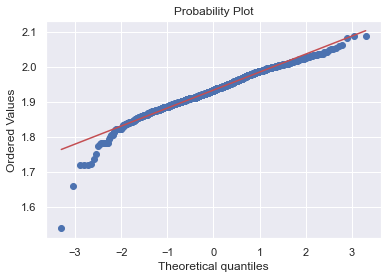

In [327]:
#histogram and normal probability plot
sns.distplot(df_train[df_train['TotalBsmtSF']>0]['TotalBsmtSF'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train[df_train['TotalBsmtSF']>0]['TotalBsmtSF'], plot=plt)

на этом с нормальностью закончили. переходим к гомоскедастичности

для случая двух переменных ее удобно оценивать графически, на основе scatter-графиков.
если точки на графике образуют овал, песочные часы или конус,
то выборка не является гомоскедастичной, а является гетероскедастичной.
То есть зависимость двух переменных имеет разную дисперсию на разных участках графика

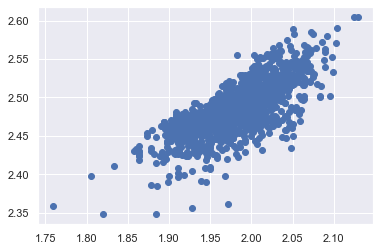

In [301]:
#scatter plot
plt.scatter(df_train['GrLivArea'], df_train['SalePrice']);



график зависимости GrLivArea-SalePrice до лог-трансформации имел коническую форму
после лог-трансформации зависимость гомоскедастична

In [302]:
df_train.shape

(1457, 62)

In [303]:
#convert categorical variable into dummy
#df_train = pd.get_dummies(df_train)

In [304]:
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'Functional',
       'Fireplaces', 'GarageCars', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SaleType', 'SaleCondition', 'SalePrice',
       'HasBsmt'],
      dtype='object')

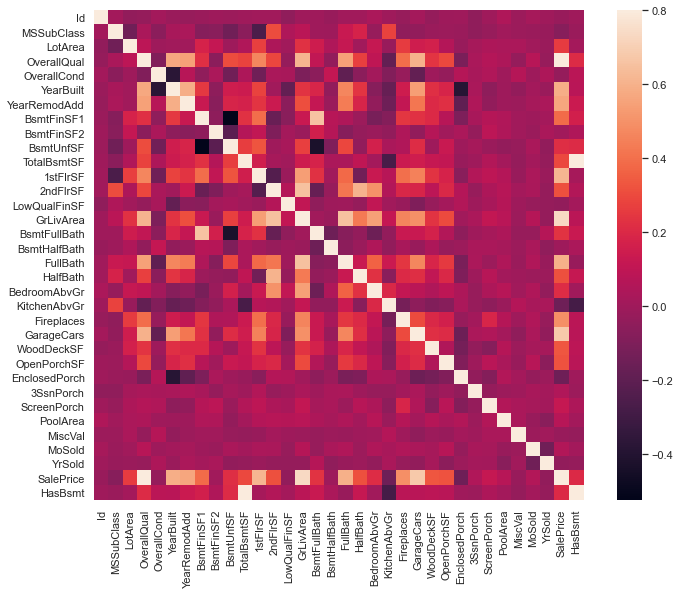

In [305]:
corrmat = df_train.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

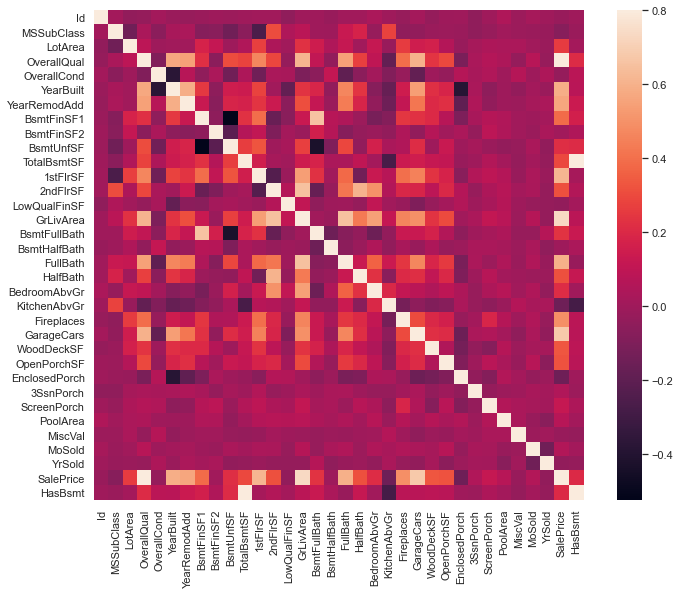

In [307]:
corrmat = df_train.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

In [7]:
df_train.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460.000000,1460,1201.000000,1460.000000,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460,1460,1460,1452,1452.000000,1460,1460,1460,1423,1423,1422,1423,1460.000000,1422,1460.000000,1460.000000,1460.000000,1460,1460,1460,1459,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460.000000,1460,1460.000000,770,1379,1379.000000,1379,1460.000000,1460.000000,1379,1379,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,7,281,54,1460.000000,1460.000000,1460.000000,1460,1460,1460.000000
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,15,16,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,NaN,1151,NaN,NaN,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,NaN,NaN,NaN,NaN,1141,1434,515,504,864,NaN,906,1282,647,649,1311,953,430,NaN,1256,NaN,NaN,NaN,1428,741,1365,1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,735,NaN,1360,NaN,380,870,NaN,605,NaN,NaN,1311,1326,1340,NaN,NaN,NaN,NaN,NaN,NaN,3,157,49,NaN,NaN,NaN,1267,1198,NaN
mean,730.500000,56.897260,NaN,70.049958,10516.828082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.099315,5.575342,1971.267808,1984.865753,NaN,NaN,NaN,NaN,NaN,103.685262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.639726,NaN,46.549315,567.240411,1057.429452,NaN,NaN,NaN,NaN,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,NaN,6.517808,NaN,0.613014,NaN,NaN,1978.506164,NaN,1.767123,472.980137,NaN,NaN,NaN,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,NaN,NaN,NaN,43.489041,6.321918,2007.815753,NaN,NaN,180921.195890
std,421.610009,42.300571,NaN,24.284752,9981.264932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.382997,1.112799,30.202904,20.645407,NaN,NaN,NaN,NaN,NaN,181.066207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.098091,NaN,161.319273,441.866955,438.705324,NaN,NaN,NaN,NaN,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,NaN,1.625393,NaN,0.644666,NaN,NaN,24.689725,NaN,0.747315,213.804841,NaN,NaN,NaN,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,NaN,NaN,NaN,496.123024,2.703626,1.328095,NaN,NaN,79442.502883
min,1.000000,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1900.000000,NaN

# закончил на 3SsnPorch

In [309]:
df_train['PavedDrive'].value_counts()

Y    1337
N      90
P      30
Name: PavedDrive, dtype: int64

<AxesSubplot:xlabel='PavedDrive', ylabel='SalePrice'>

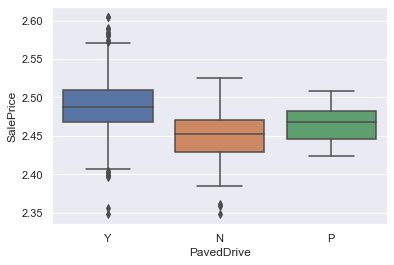

In [310]:
sns.boxplot(x='PavedDrive', y='SalePrice', data=df_train)

In [312]:
#sns.boxplot(x='TotalBath', y='SalePrice', data=df_train)

In [313]:
#df_train['TotalBath'].value_counts()

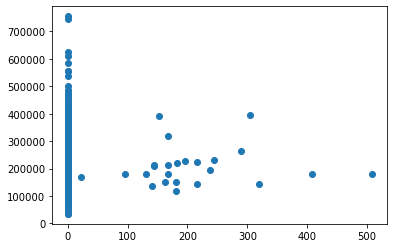

In [8]:
plt.scatter(df_train['3SsnPorch'], df_train['SalePrice']);

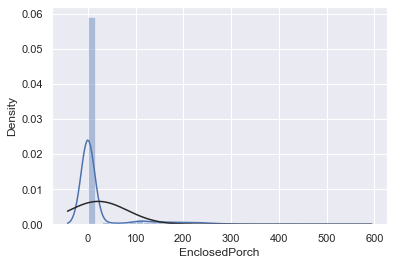

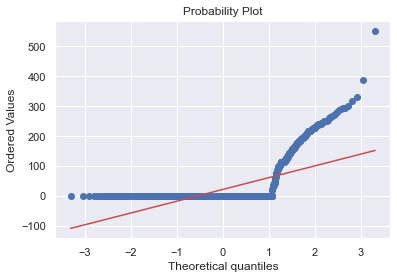

In [366]:
# let try to normalize TotalBsmtSF

sns.distplot(df_train['EnclosedPorch'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['EnclosedPorch'], plot=plt)

# анализ графтка показывает, что:
# - имеется скос вправо
# - значительное число нулевых значений, для которых неприменима лог-трансформация

In [367]:
df_train['HasEnclosedPorch'] = pd.Series(len(df_train['EnclosedPorch']), index=df_train.index)
df_train['HasEnclosedPorch'] = 0 
df_train.loc[df_train['EnclosedPorch']>0,'HasEnclosedPorch'] = 1

In [368]:
df_train.HasEnclosedPorch.value_counts()

0    1252
1     208
Name: HasEnclosedPorch, dtype: int64

In [109]:
df_train['2ndFlrSF'] = np.log(df_train['2ndFlrSF'])

In [369]:
#transform data
df_train.loc[df_train['HasEnclosedPorch']==1,'EnclosedPorch'] = np.log(df_train['EnclosedPorch'])

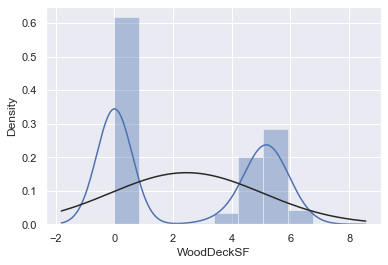

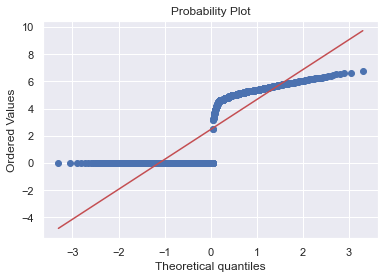

In [357]:
sns.distplot(df_train['WoodDeckSF'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['WoodDeckSF'], plot=plt)

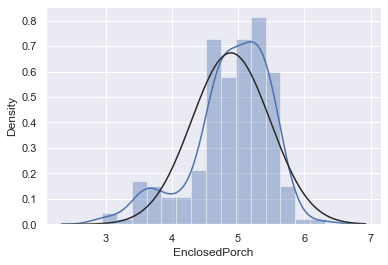

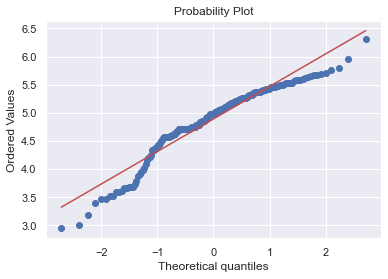

In [370]:
#histogram and normal probability plot
sns.distplot(df_train[df_train['EnclosedPorch']>0]['EnclosedPorch'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train[df_train['EnclosedPorch']>0]['EnclosedPorch'], plot=plt)